# Fetching the Metadata of Multiple Books Through the ALMA API

In this example, we will use Pandas to read the alto-manifest file and create a dataframe, from which we can fetch metadata on all the books listed. 

Additionally, we will display the covers of each books.

## Importing relevant libraries

We will import NumPy and Pandas for reading the alto-manifest file and creating the dataframe. The requests library will retrieve bibliographical metadata and image files. 

In [1]:
import numpy as np
import pandas as pd
import requests
import IPython.display as Disp
import xml.etree.ElementTree as ET

## Reading in the "alto-manifest" excel file

We will create a dataframe "df" which we will use to fetch bibliographical metadata.

(This notebook assumes that the file 'alto-manifest.xlsx' is in the same directory as the notebook.)

In [2]:
df = pd.read_excel('alto-manifest.xlsx', sheet_name='pyexcel_sheet1')

For ease of use, we will clean up the MMSID column and turn its values to Integer type

In [4]:
df['MMSID'] = df['MMSID'].str[1:]
df['MMSID'] = pd.to_numeric(df['MMSID'])

In [5]:
df.head() # Displaying first 5 rows

,IE PID,Call #,MMSID,Barcode,Image FLs,Alto FLs
0,IE14126136,DSM/340.1/10,991020315409702626,426867,FL14126976;FL14126977;FL14126978;FL14126979;FL...,FL14126138;FL14126139;FL14126140;FL14126141;FL...
1,IE13510201,DSM/994/193,991020322559702626,426868,FL13510529;FL13510530;FL13510531;FL13510532;FL...,FL13510203;FL13510204;FL13510205;FL13510206;FL...
2,IE13989318,DSM/347.9423025/1,991020314849702626,426874,FL13989707;FL13989708;FL13989710;FL13989713;FL...,FL13989320;FL13989321;FL13989322;FL13989323;FL...
3,IE13784799,DSM/823.9/P897/1,991020537659702626,441088,FL13785321;FL13785329;FL13785331;FL13785333;FL...,FL13784801;FL13784802;FL13784803;FL13784804;FL...
4,IE13568896,DSM/994.602/14,991020536689702626,441089,FL13569200;FL13569207;FL13569214;FL13569221;FL...,FL13568898;FL13568899;FL13568900;FL13568902;FL...


## Populating a dataframe with bibliographical metadata

We will use the df dataframe to query the AlmaAPI and populate a new dataframe "bib_df" with bibliographical metadata

In [6]:
# Base URL for fetching bib data
base_url = "https://api-ap.hosted.exlibrisgroup.com/almaws/v1/bibs"

#API Key (input your own key here)
apikey = "xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx"


Here are some functions for retrieving bibliographical metadata for multiple books and consolidating it into one dataframe

In [7]:

def bibdf(mms_id,apikey):
    response = requests.get(base_url, params={'mms_id': mms_id,'apikey':apikey})
    root = ET.fromstring(response.text)
        
    # We will add tags as column names in our dataframe, and attribute values for our search item as a row
    columns=[]
    attribs=[]
    for i in root[0]:
        columns.append(i.tag)
        attribs.append(i.text)
    
    biblio = pd.DataFrame(columns=columns)
    biblio.loc[len(biblio)] = attribs 
    
    return biblio

def consolbib(MMSID, apikey):
    bib = pd.DataFrame()
    for i in MMSID:
        bib1=bibdf(i,apikey)
        bib=bib.append(bib1, ignore_index = True, sort=False) 
    return bib


In [8]:
# Retrieving metadata for all books in the alto-manifest file

bib_df=consolbib(df.MMSID,apikey)


In [9]:

bib_df['mms_id'] = pd.to_numeric(bib_df['mms_id']) # Formatting the mms_id column

bib_df.head() # Display first 5 rows of the metadata dataframe


,mms_id,record_format,linked_record_id,title,author,network_numbers,place_of_publication,date_of_publication,publisher_const,holdings,created_by,created_date,last_modified_by,last_modified_date,suppress_from_publishing,originating_system,originating_system_id,cataloging_level,record,complete_edition
0,991020315409702626,marc21,None,The theory of legal duties and rights : an int...,"Hearn, William Edward,",None,Melbourne :,1883.,John Ferres Govt Printer,None,import,2016-05-17Z,exl_api,2019-06-29Z,false,OTHER,b15689608-61slnsw_inst,00,None,NaN
1,991020322559702626,marc21,None,Colonisation in 1876 /,Capricornus.,None,Sydney :,1876-1877.,Turner and Henderson,None,import,2016-05-17Z,System,2019-08-01Z,false,OTHER,b15691822-61slnsw_inst,NaN,None,NaN
2,991020314849702626,marc21,None,The civil jurisdiction of the local courts of ...,"Fenn, Charles F.",None,Adelaide :,1872,sn,None,import,2016-05-17Z,exl_api,2019-06-28Z,false,OTHER,b15689359-61slnsw_inst,00,None,NaN
3,991020537659702626,marc21,None,"Under the gum tree : Australian ""bush"" stories /","Praed, Campbell,",None,London :,1890.,Trischler,None,import,2016-05-17Z,exl_api,2019-06-18Z,false,OTHER,b15751582-61slnsw_inst,00,None,NaN
4,991020536689702626,marc21,None,Van Diemen's Land Company : (from History of V...,NaN,None,London :,1832.,British magazine,None,import,2016-05-17Z,exl_api,2019-06-12Z,false,OTHER,b15751296-61slnsw_inst,00,None,NaN


## Displaying cover image and metadata for a specific MMS ID

Using the "df" dataframe and the "bib_df" dataframe, we will output the cover image and bibliographical metadata for specific MMS IDs.

'coverpull' is a function for pulling the cover of a specific MMS ID (from the first FL ID in the df dataframe)

In [10]:
def coverpull(df, mms_id):
    flid = df[df['MMSID']==mms_id]['Image FLs'].tolist()[0].split(';')[0]
    img_url = "http://digital.sl.nsw.gov.au/delivery/DeliveryManagerServlet"
    resp1 = requests.get(img_url,params={'dps_pid':flid, 'dps_func':'stream'})
    return resp1
    

### We set the MMS ID variable with the entry we want to look up the cover and metadata for

,mms_id,record_format,linked_record_id,title,author,network_numbers,place_of_publication,date_of_publication,publisher_const,holdings,created_by,created_date,last_modified_by,last_modified_date,suppress_from_publishing,originating_system,originating_system_id,cataloging_level,record,complete_edition
3,991020537659702626,marc21,None,"Under the gum tree : Australian ""bush"" stories /","Praed, Campbell,",None,London :,1890.,Trischler,None,import,2016-05-17Z,exl_api,2019-06-18Z,false,OTHER,b15751582-61slnsw_inst,00,None,NaN


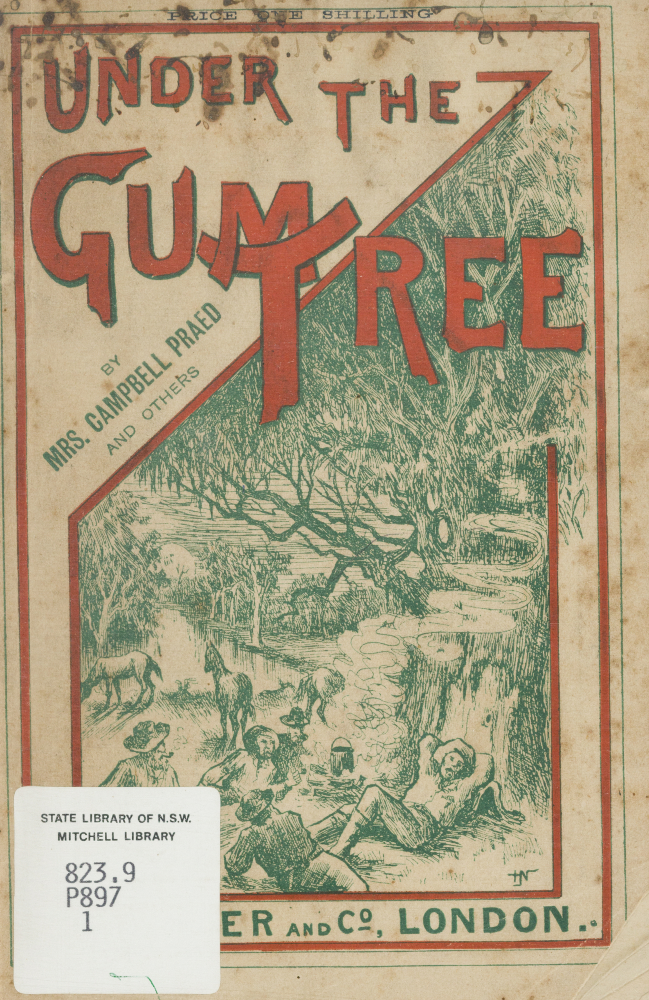

In [11]:
mms_id = 991020537659702626

resp=coverpull(df, mms_id)

meta=bib_df[bib_df['mms_id']==mms_id]

Disp.display(Disp.HTML(meta.to_html()))
Disp.Image(data=resp.content,width=500)
